In [63]:
## common 

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import os
import cv2
from IPython.display import clear_output as cls
import tensorflow as tf
from tensorflow import keras
from sklearn.metrics import *


## Data
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

# from tensorflow.keras.utils import to_categorical



# Data Visualization
import plotly.express as px
import matplotlib.pyplot as plt



## Model
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, Activation, BatchNormalization

#For model evaluation
from sklearn.metrics import confusion_matrix

# Load Model
from keras.models import load_model






# Load Data

In [2]:
#dataset path
DIRECTORY = r"G:\Car and Bike Dataset\archive\Car-Bike-Dataset"
CATEGORIES = ["Bike", "Car"]

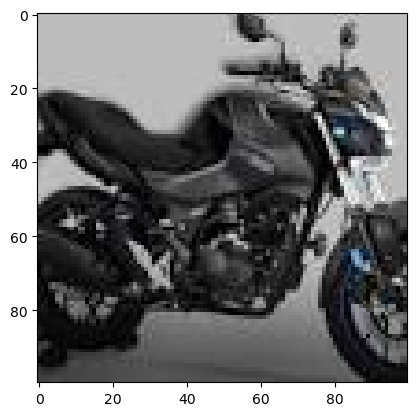

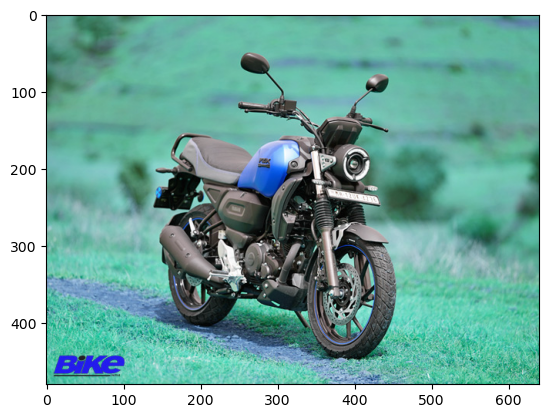

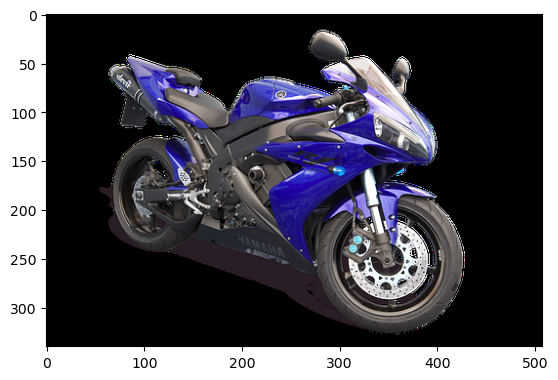

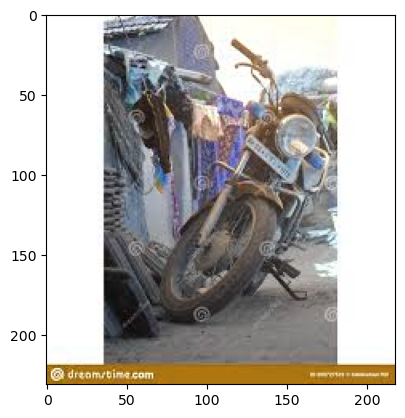

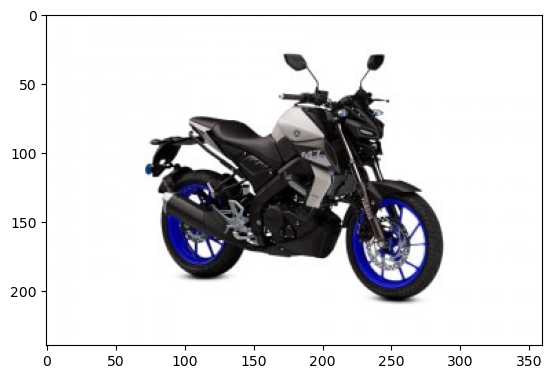

...

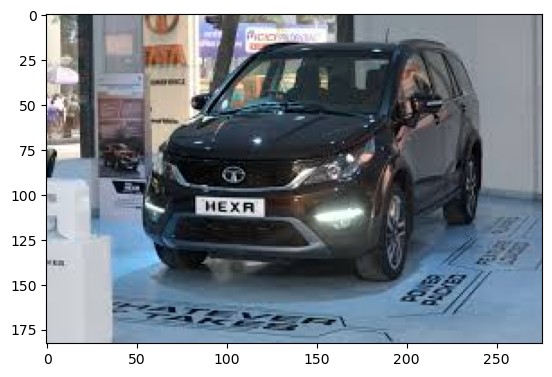

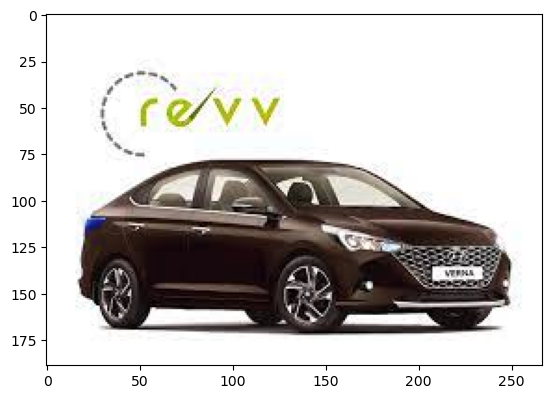

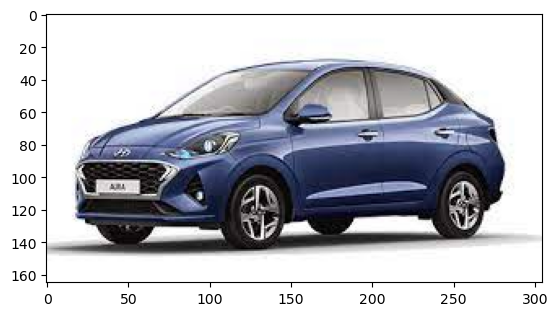

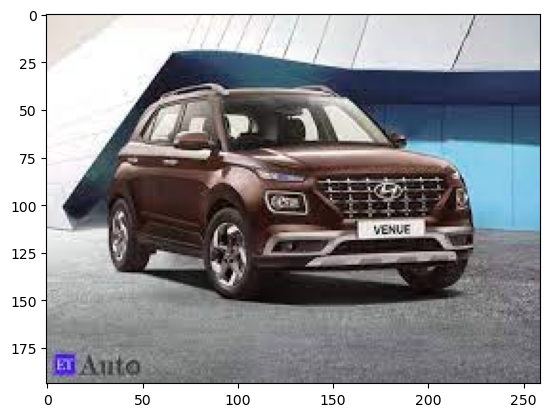

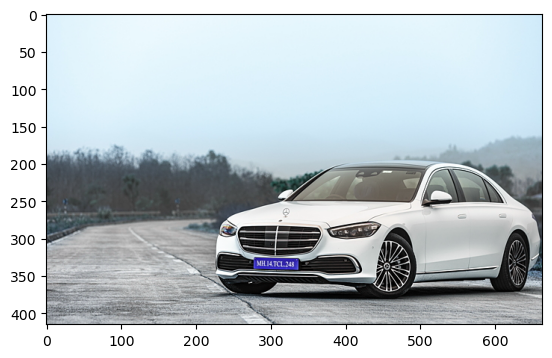

In [3]:
data = []
labels = []

for category in CATEGORIES:
    path = os.path.join(DIRECTORY, category)
    x = 0
    for img in os.listdir(path):
        x+= 1 
        img_path = os.path.join(path, img)
        image = load_img(img_path, target_size=(250, 250))
        image = img_to_array(image)
        image = preprocess_input(image)
    
        data.append(image)
        labels.append(category)
        
        image = cv2.imread(os.path.join(path,img) ,1)
        plt.imshow(image)  
        plt.show()  # display!
        if x==10 : 
            break 

In [ ]:
plt.imshow(data[2])

# Data Augmentation

In [38]:
train_datagen = ImageDataGenerator(rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2)

train_generator = train_datagen.flow_from_directory(
    DIRECTORY,
    target_size=(256 , 256),
    batch_size= 32,
    class_mode='binary',
    subset='training')

Test_generator = train_datagen.flow_from_directory(
   DIRECTORY,
    target_size=(256, 256),
    batch_size= 32,
    class_mode='binary',
    subset='validation')

Found 3200 images belonging to 2 classes.
Found 800 images belonging to 2 classes.


In [10]:
labels = (train_generator.class_indices)
labels = dict((v , k) for k , v in labels.items())
print(labels)

{0: 'Bike', 1: 'Car'}


# Data Visualizaton 

In [62]:
# Class Names
root_path = DIRECTORY
class_names = sorted(os.listdir(root_path))
n_classes = len(class_names)




# Show
print(f"Total Number of Classes : {n_classes} \nClass Names : {class_names}")

Total Number of Classes : 2 
Class Names : ['Bike', 'Car']


In [40]:
# class_names = DIRECTORY
def show_images(GRID=[5,5], model=None, size=(20,20), data=train_generator):
    n_rows = GRID[0]
    n_cols = GRID[1]
    n_images = n_cols * n_rows
    
    i = 1
    plt.figure(figsize=size)
    for images, labels in data:
        id = np.random.randint(len(images))
        image, label = images[id], class_names[int(labels[id])]
        
        plt.subplot(n_rows, n_cols, i)
        plt.imshow(image)
        
        if model is None:
            title = f"Class : {label}"
        else:
            pred = class_names[int(np.argmax(model_vgg.predict(image[np.newaxis, ...])))]
            title = f"Org : {label}, Pred : {pred}"
            cls()
        
        plt.title(title)
        plt.axis('off')
        
        i+=1
        if i>=(n_images+1):
            break
            
    plt.tight_layout()
    plt.show()

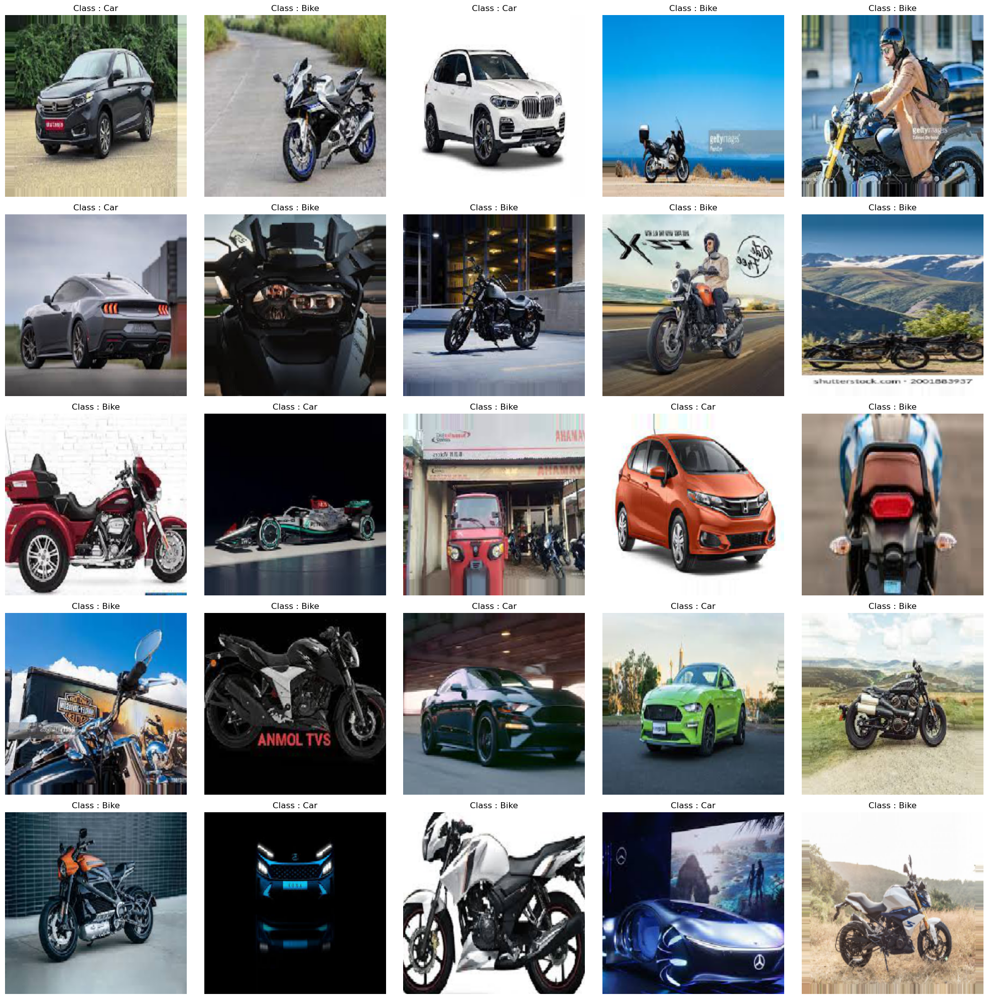

In [41]:
show_images()

# Build Model

In [42]:
base_model = tf.keras.applications.VGG19(input_shape=(256, 256,3),
                                               include_top=False,
                                               weights = "imagenet"
                                               )
base_model.trainable = False

In [53]:
model_vgg = tf.keras.Sequential([
    base_model,
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(2, activation="softmax")
])

model_vgg.compile(loss= tf.keras.losses.SparseCategoricalCrossentropy() , optimizer=tf.keras.optimizers.Adam(learning_rate = 0.001) , metrics='accuracy')

In [54]:
model_vgg.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 8, 8, 512)         20024384  
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 4, 4, 512)        0         
 2D)                                                             
                                                                 
 flatten_9 (Flatten)         (None, 8192)              0         
                                                                 
 dense_9 (Dense)             (None, 2)                 16386     
                                                                 
Total params: 20,040,770
Trainable params: 16,386
Non-trainable params: 20,024,384
_________________________________________________________________


In [55]:
VGGModelFit = model_vgg.fit(train_generator ,
          validation_data = Test_generator ,
          epochs = 5 ,
#           steps_per_epoch = 3200/32, 
#           validation_steps = 800/32, 
          )

Epoch 1/5
100/100 [==============================] - 1387s 14s/step - loss: 0.2189 - accuracy: 0.9122 - val_loss: 0.0910 - val_accuracy: 0.9688
Epoch 2/5
100/100 [==============================] - 1457s 15s/step - loss: 0.0759 - accuracy: 0.9712 - val_loss: 0.0758 - val_accuracy: 0.9787
Epoch 3/5
100/100 [==============================] - 8155s 82s/step - loss: 0.0581 - accuracy: 0.9778 - val_loss: 0.0683 - val_accuracy: 0.9787
Epoch 4/5
100/100 [==============================] - 1320s 13s/step - loss: 0.0476 - accuracy: 0.9853 - val_loss: 0.0639 - val_accuracy: 0.9750
Epoch 5/5
100/100 [==============================] - 1579s 16s/step - loss: 0.0427 - accuracy: 0.9844 - val_loss: 0.0765 - val_accuracy: 0.9750


In [56]:
data = pd.DataFrame(VGGModelFit.history)
data.head()

,loss,accuracy,val_loss,val_accuracy
0,0.218879,0.912188,0.091028,0.96875
1,0.075906,0.971250,0.075820,0.97875
2,0.058126,0.977813,0.068325,0.97875
3,0.047635,0.985313,0.063922,0.97500
4,0.042745,0.984375,0.076531,0.97500


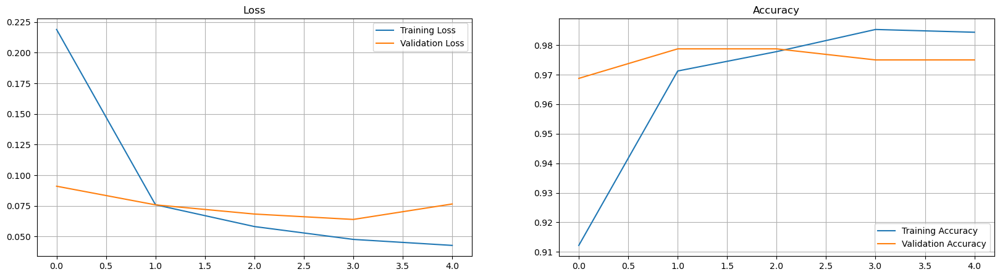

In [57]:
plt.figure(figsize=(20,5))

plt.subplot(1,2,1)
plt.plot(data.loss, label='Training Loss')
plt.plot(data.val_loss, label='Validation Loss')
plt.title("Loss")
plt.grid()
plt.legend()

plt.subplot(1,2,2)
plt.plot(data.accuracy, label='Training Accuracy')
plt.plot(data.val_accuracy, label='Validation Accuracy')
plt.title("Accuracy")
plt.grid()
plt.legend()

plt.show()

# Model Evaluation

In [58]:
Evaluation = model_vgg.evaluate(Test_generator) 

23/25 [==========================>...] - ETA: 20s - loss: 0.0789 - accuracy: 0.9783

C:\Users\ww\anaconda3\lib\site-packages\PIL\Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


25/25 [==============================] - 259s 10s/step - loss: 0.0748 - accuracy: 0.9800


In [59]:
pred = model_vgg.predict(Test_generator)  

25/25 [==============================] - 281s 11s/step


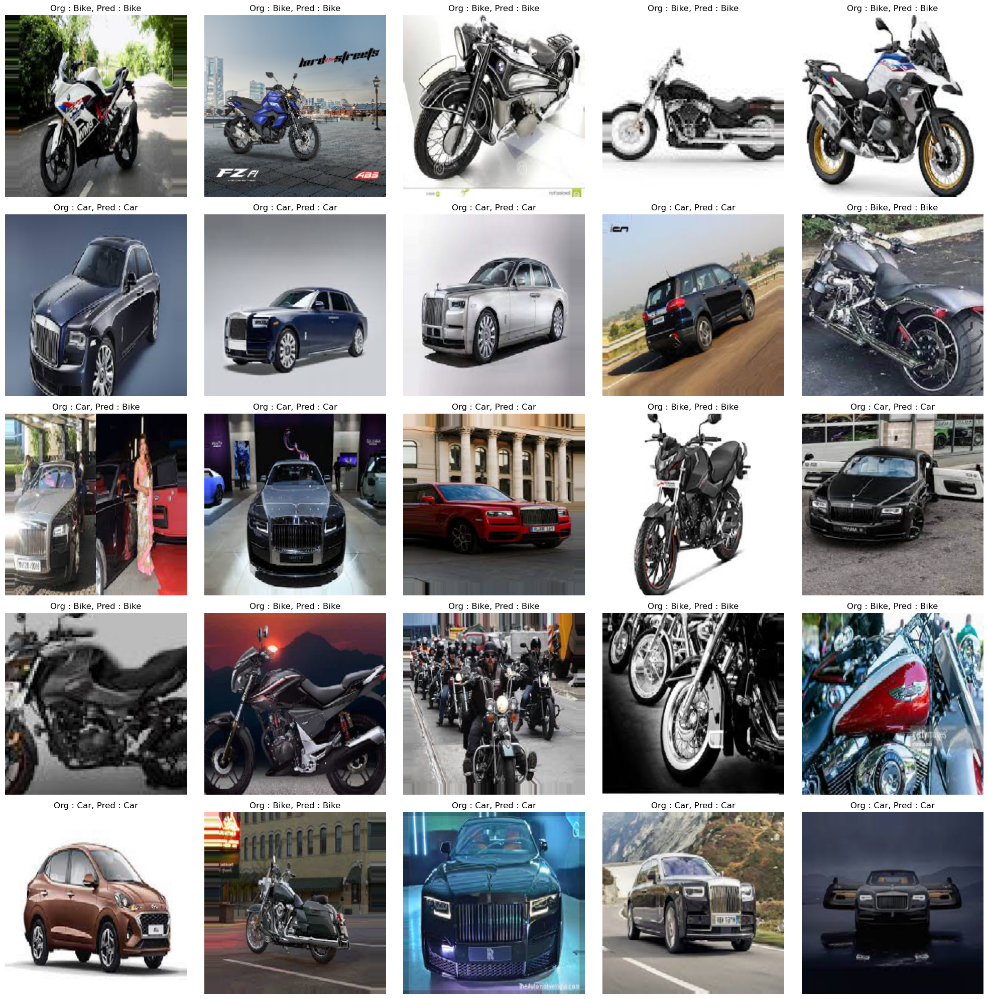

In [60]:
# Visualize Predictions
show_images(model=model_vgg, data=Test_generator)

# Save Model

In [61]:
model_vgg.save('my_model.h5') 

In [ ]:

model_vgg = load_model('my_model.h5')

In [ ]:
# import pickle
# Pkl_Filename = "VGG_Model.pkl"  

# with open(Pkl_Filename, 'wb') as file:  
#     pickle.dump(model_vgg, file)

In [ ]:
# Load the Model back from file
# import pickle
# Pkl_Filename = "VGG_Model.pkl"  
# with open(Pkl_Filename, 'rb') as file:  
#     Pickled_LR_Model = pickle.load(file)

# Pickled_LR_Model